<a href="https://colab.research.google.com/github/thariqabe666/Project-4-PPE-Compliance-Auditor/blob/main/capstone4_thariq_ahmad_ppe_audit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **👷‍♂️👷‍♀️Auditor K3 Otomatis**

# Bab 1: Persiapan Environment dan Dataset

Bab ini mencakup semua langkah konfigurasi awal. Tujuannya adalah untuk menyiapkan *runtime* Google Colab, menginstal *framework* YOLOv12 SOTA (State-of-the-Art) beserta dependensinya, dan memuat dataset *Construction Safety* ke dalam *environment* kerja.

## 1.1. Menghubungkan Google Drive

Langkah pertama adalah menghubungkan Google Drive. Ini diperlukan untuk mengakses *file* dataset (dalam format .zip) yang tersimpan di Drive dan untuk menyimpan *file* model (`best.pt`) yang sudah terlatih nantinya.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1.2. Kloning Repository Resmi YOLOv12

*Repository* yang akan digunakan adalah implementasi resmi dari penulis *paper* (`sunsmarterjie`). Berdasarkan `README`, *repo* ini berisi implementasi yang lebih efisien dan stabil dibandingkan dengan yang ada di *fork* Ultralytics utama.

In [2]:
!git clone https://github.com/sunsmarterjie/yolov12.git

Cloning into 'yolov12'...
remote: Enumerating objects: 1163, done.
remote: Counting objects: 100% (645/645), done.
remote: Compressing objects: 100% (201/201), done.
remote: Total 1163 (delta 477), reused 444 (delta 444), pack-reused 518 (from 1)
Receiving objects: 100% (1163/1163), 1.78 MiB | 6.36 MiB/s, done.
Resolving deltas: 100% (586/586), done.


## 1.3. Instalasi Dependensi

Instalasi dibagi menjadi dua tahap: `FlashAttention` (komponen inti untuk kecepatan di GPU T4) dan *library* YOLOv12 itu sendiri.


### 1.3.1. Instalasi FlashAttention

Sesuai petunjuk di *paper* dan `README`, `FlashAttention` adalah dependensi krusial. *File* `.whl` spesifik akan diunduh dan diinstal untuk memastikan kompatibilitas dengan GPU T4 Colab.

In [ ]:
# Mengunduh file .whl yang kompatibel
!wget https://github.com/Dao-AILab/flash-attention/releases/download/v2.8.3/flash_attn-2.8.3+cu12torch2.4cxx11abiFALSE-cp312-cp312-linux_x86_64.whl

# Menginstal file .whl
!pip install flash_attn-2.8.3+cu12torch2.4cxx11abiFALSE-cp312-cp312-linux_x86_64.whl

--2025-11-14 04:24:23--  https://github.com/Dao-AILab/flash-attention/releases/download/v2.8.3/flash_attn-2.8.3+cu12torch2.4cxx11abiFALSE-cp312-cp312-linux_x86_64.whl
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/494232964/a4cd859f-ba00-4f18-a749-361d99862bb7?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-11-14T05%3A16%3A09Z&rscd=attachment%3B+filename%3Dflash_attn-2.8.3%2Bcu12torch2.4cxx11abiFALSE-cp312-cp312-linux_x86_64.whl&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2025-11-14T04%3A16%3A01Z&ske=2025-11-14T05%3A16%3A09Z&sks=b&skv=2018-11-09&sig=xfLB8y4JCe7aH9mz2YiY331%2Fv6UW%2FRWnF%2FECKMpGNaQ%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNl

### 1.3.2. Instalasi YOLOv12 dan Requirements

Selanjutnya, semua *library* lain yang diperlukan diinstal dari file `requirements.txt`. Perintah `!pip install -e .` adalah yang paling penting; ini akan menginstal *package* YOLOv12 yang telah dimodifikasi dari *repo* yang baru dikloning ke dalam *environment* Colab.

In [3]:
# Masuk ke direktori repository
%cd /content/yolov12

# [FIX] Edit requirements.txt untuk meng-comment baris flash_attn.
# Ini mencegah pip menginstal versi yang salah,
# karena kita sudah menginstal versi yang benar (cp312) di 1.3.1.
!sed -i '/flash_attn/s/^/#/' requirements.txt

# Sekarang, instal sisa requirements dari file yang sudah dimodifikasi
!pip install -r requirements.txt

# Instal package YOLOv12 ini (editable mode)
!pip install -e .

/content/yolov12
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.8/50.8 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.5/41.5 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 98.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
ERROR: Could not find a version that satisfies the requirement onnxruntime==1.15.1 (from versions: 1.17.0, 1.17.1, 1.17.3, 1.18.0, 1.18.1, 1.19.0, 1.19.2, 1.20.0, 1.20.1, 1.21.0, 1.21.1, 1.22.0, 1.22.1, 1.23.0, 1.23.1, 1.23.2, 1.24.0.dev20251031003)
ERROR: No matching distribution found for onnxruntime==1.15.1
Obtaining file:///content/yolov12
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building

## 1.4. Penyiapan Dataset (Construction Safety)

Dataset, yang diasumsikan tersimpan di Google Drive, akan diekstrak ke *runtime* Colab. Ini adalah praktik terbaik untuk mempercepat proses I/O (Input/Output) selama *training*, karena membaca data dari *disk* lokal Colab jauh lebih cepat daripada dari Drive.


### 1.4.1. Ekstrak Dataset dari Google Drive

Perintah `unzip` digunakan untuk mengekstrak konten arsip ke folder `/content/dataset/`.



In [4]:
!unzip "/content/drive/MyDrive/Colab Notebooks/purwadhika ai engineering/modul 4: computer vision/capstone 4/Copy of construction safety.v1i.yolov12.zip" -d /content/dataset

Archive:  /content/drive/MyDrive/Colab Notebooks/purwadhika ai engineering/modul 4: computer vision/capstone 4/Copy of construction safety.v1i.yolov12.zip
  inflating: /content/dataset/README.dataset.txt  
  inflating: /content/dataset/README.roboflow.txt  
  inflating: /content/dataset/data.yaml  
   creating: /content/dataset/test/
   creating: /content/dataset/test/images/
 extracting: /content/dataset/test/images/ppe_0000_jpg.rf.7960e8f628d8a3fc17c6b858dec87a64.jpg  
 extracting: /content/dataset/test/images/ppe_0004_jpg.rf.0a9886fc2b97ff81ff4ac5727ef66148.jpg  
 extracting: /content/dataset/test/images/ppe_0008_jpg.rf.f3da9c637440a2a4dd256520f2f2e765.jpg  
 extracting: /content/dataset/test/images/ppe_0009_jpg.rf.46d6856348dc2ed1e531bb1bc17983f7.jpg  
 extracting: /content/dataset/test/images/ppe_0013_jpg.rf.f1bbbf35f9f80c25bd2744171b83ae6f.jpg  
 extracting: /content/dataset/test/images/ppe_0014_jpg.rf.5b90e4a7707532584cbf89590d6f1e13.jpg  
 extracting: /content/dataset/test/imag



### 1.4.2. Verifikasi dan Modifikasi `data.yaml`

Ini adalah **langkah manual** yang krusial. File `data.yaml` perlu diedit untuk memberi tahu YOLOv12 di mana menemukan gambar *training* dan *validation*. Memastikan isinya seperti ini:

  ```yaml
    train: /content/dataset/train/images
    val: /content/dataset/valid/images
    test: /content/dataset/test/images

    # Memastikan nc (number of classes) dan names sudah benar
    nc: 5
    names: ['helmet', 'no-helmet', 'no-vest', 'person', 'vest']
  ```

# Bab 2: Pelatihan Model (Fine-Tuning) YOLOv12

Setelah *environment* dan dataset siap, Bab 2 berfokus pada proses *training* itu sendiri. Proses ini adalah *fine-tuning*, bukan *training from scratch*. Model YOLOv12s (Turbo) yang sudah dilatih pada dataset COCO akan digunakan sebagai titik awal, kemudian dilatih kembali agar spesifik mengenali 5 kelas K3 (PPE) dari dataset *Construction Safety*.

## 2.1. Memuat & Menjalankan TensorBoard

In [ ]:
# Memuat ekstensi TensorBoard
%load_ext tensorboard

# Mengarahkan ke folder 'runs' (yang akan dibuat oleh YOLO)
# Folder ini ada di dalam /content/yolov12/
%tensorboard --logdir /content/yolov12/runs/

<IPython.core.display.Javascript object>

## 2.2. Mengunduh Bobot (Weights) Pre-trained YOLOv12s

*Weights* "Turbo" `yolov12s.pt` akan diunduh dari *release* resmi di GitHub. *File* ini berisi pengetahuan dasar model yang akan kita adaptasi.

In [ ]:
# Mengunduh weights pre-trained YOLOv12s (Turbo)
!wget https://github.com/sunsmarterjie/yolov12/releases/download/turbo/yolov12s.pt

--2025-11-14 04:27:37--  https://github.com/sunsmarterjie/yolov12/releases/download/turbo/yolov12s.pt
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/928546208/9b2d6634-21df-409a-9d45-3fc91af3d98f?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-11-14T05%3A17%3A02Z&rscd=attachment%3B+filename%3Dyolov12s.pt&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2025-11-14T04%3A16%3A30Z&ske=2025-11-14T05%3A17%3A02Z&sks=b&skv=2018-11-09&sig=BOsN8LqjlocdLmvyBBNDyBUr2w5L495SiTol04hV3sI%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlbnQuY29tIiwia2V5Ijoia2V5MSIsImV4cCI6MTc2MzA5NjI1OCwibmJmIjoxNzYzMDk0NDU4LCJwYXRoIjoicmVsZWFzZWFzc2V0cHJvZHVjdGlvbi5ibG9iLmNvc

## 2.3. Menjalankan Proses Fine-Tuning

Ini adalah inti dari Bab 2. Sebuah skrip Python akan dieksekusi untuk memulai proses *training* menggunakan *library* YOLOv12 (yang sudah dimodifikasi) yang telah diinstal di Bab 1.

Parameter telah disesuaikan untuk *fine-tuning* pada satu GPU T4 di Colab:

  * **model:** Dimulai dari `yolov12s.pt` (bukan file `.yaml`).
  * **data:** Mengarah ke *file* `data.yaml` yang telah disiapkan di `/content/dataset/`.
  * **epochs:** Diatur ke `100` (jumlah yang wajar untuk *fine-tuning*).
  * **batch:** Diatur ke `16` (sesuai dengan kapasitas memori T4).
  * **Augmentasi:** `scale`, `mixup`, dan `copy_paste` diatur sesuai rekomendasi `README` untuk model-S.
  * **name:** Memberi nama `yolov12s_ppe_audit_v1` pada *run* ini agar mudah diidentifikasi.


In [ ]:
!pip install ultralytics

In [ ]:
from ultralytics import YOLO
import os

# Tentukan path dasar project Anda di GDrive
base_project_dir = "/content/drive/MyDrive/Colab Notebooks/purwadhika ai engineering/modul 4: computer vision/capstone 4"
model_dir = os.path.join(base_project_dir, "models")
os.makedirs(model_dir, exist_ok=True)

# Path ke file yaml
data_config_path = '/content/dataset/data.yaml'

# Muat model pre-trained
model = YOLO('yolov12s.pt')

# Beri nama baru agar tidak menimpa run sebelumnya
training_run_name = 'yolov12s_ppe_audit_v2'

# Mulai training
results = model.train(
    data=data_config_path,
    epochs=100,
    batch=16,
    imgsz=640,
    device=0,
    scale=0.9,
    mixup=0.05,
    copy_paste=0.15,
    name=training_run_name,
    project='/content/yolov12/runs/detect' # Pastikan disimpan di dalam folder yolov12
)

# Simpan model terbaik ke Google Drive
best_model_path = f'/content/yolov12/runs/detect/{training_run_name}/weights/best.pt'
target_model_path = os.path.join(model_dir, 'yolov12s_best_v2.pt')

!cp "{best_model_path}" "{target_model_path}"

print(f"✅ Training selesai. Model terbaik disimpan di: {target_model_path}")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/yolov12/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
New https://pypi.org/project/ultralytics/8.3.228 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.63 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov12s.pt, data=/content/dataset/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=/content/yolov12/runs/detect, name=yolov12s_ppe_audit_v2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, clos

100%|██████████| 755k/755k [00:00<00:00, 45.7MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1      9344  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2, 1, 2]          
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1     37120  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2, 1, 4]        
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  2    677120  ultralytics.nn.modules.block.A2C2f           [256, 256, 2, True, 4]        
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.26M/5.26M [00:00<00:00, 158MB/s]


AMP: checks passed ✅


train: Scanning /content/dataset/train/labels... 997 images, 0 backgrounds, 0 corrupt: 100%|██████████| 997/997 [00:00<00:00, 1922.94it/s]

train: New cache created: /content/dataset/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/content/yolov12/ultralytics/data/augment.py:1853: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),
val: Scanning /content/dataset/valid/labels... 119 images, 0 backgrounds, 0 corrupt: 100%|██████████| 119/119 [00:00<00:00, 1375.61it/s]


val: New cache created: /content/dataset/valid/labels.cache
Plotting labels to /content/yolov12/runs/detect/yolov12s_ppe_audit_v2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 121 weight(decay=0.0), 128 weight(decay=0.0005), 127 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/yolov12/runs/detect/yolov12s_ppe_audit_v2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      6.87G      1.466      1.669      1.415        117        640: 100%|██████████| 63/63 [00:58<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:13<00:00,  3.43s/it]

                   all        119        715      0.799      0.569      0.663      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      7.01G       1.51      1.164      1.426         52        640: 100%|██████████| 63/63 [00:35<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.43it/s]

                   all        119        715      0.352      0.383      0.337      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      6.78G      1.548      1.229      1.484         37        640: 100%|██████████| 63/63 [00:34<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.48it/s]

                   all        119        715      0.509      0.471      0.476      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      6.98G      1.569      1.228      1.474         85        640: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.41it/s]

                   all        119        715      0.661      0.497      0.533      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      6.94G      1.559      1.178      1.463         81        640: 100%|██████████| 63/63 [00:33<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  2.00it/s]

                   all        119        715      0.732      0.624      0.686      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      6.91G      1.523      1.119      1.446         51        640: 100%|██████████| 63/63 [00:34<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.51it/s]

                   all        119        715      0.455      0.758      0.678      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      6.81G        1.5        1.1      1.428         77        640: 100%|██████████| 63/63 [00:34<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        119        715      0.794      0.547      0.744      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      6.93G      1.466      1.057        1.4         69        640: 100%|██████████| 63/63 [00:34<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.56it/s]

                   all        119        715      0.634      0.639      0.711      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      6.96G      1.484      1.071      1.416         22        640: 100%|██████████| 63/63 [00:34<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]

                   all        119        715      0.689      0.738      0.729      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         7G      1.466      1.037      1.393         57        640: 100%|██████████| 63/63 [00:34<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.42it/s]

                   all        119        715      0.767      0.714      0.767      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         7G       1.44      1.004      1.383         80        640: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.24it/s]

                   all        119        715      0.629      0.775      0.759      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      6.94G      1.432     0.9779      1.372         50        640: 100%|██████████| 63/63 [00:34<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        119        715      0.638      0.747      0.739      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      6.96G       1.43     0.9685      1.369         50        640: 100%|██████████| 63/63 [00:35<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.19it/s]

                   all        119        715      0.772      0.739      0.783       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      6.95G      1.425      0.981      1.371         37        640: 100%|██████████| 63/63 [00:34<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.48it/s]

                   all        119        715      0.738      0.742      0.788      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         7G       1.42     0.9582      1.377         53        640: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.63it/s]

                   all        119        715      0.727      0.712      0.773      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      6.93G      1.404     0.9342      1.362         39        640: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.47it/s]

                   all        119        715      0.624       0.82      0.789      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      6.94G      1.386      0.908      1.351         80        640: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.47it/s]

                   all        119        715      0.768      0.728      0.801      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      6.81G      1.382     0.9301      1.356        110        640: 100%|██████████| 63/63 [00:35<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.85it/s]

                   all        119        715      0.709      0.818      0.834       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      6.96G      1.387      0.915      1.363        111        640: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.41it/s]

                   all        119        715      0.834      0.729      0.839      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      6.97G      1.369     0.9052      1.345         85        640: 100%|██████████| 63/63 [00:34<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.78it/s]

                   all        119        715      0.747      0.809      0.843      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      6.92G      1.383     0.8964       1.35         77        640: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.40it/s]

                   all        119        715      0.689      0.804      0.816      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      6.95G      1.351     0.8702      1.329         94        640: 100%|██████████| 63/63 [00:35<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.54it/s]

                   all        119        715      0.816      0.775      0.816      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      6.79G      1.354     0.8613      1.315         76        640: 100%|██████████| 63/63 [00:34<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.52it/s]

                   all        119        715      0.856      0.766      0.843      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      6.93G      1.345     0.8583      1.318         40        640: 100%|██████████| 63/63 [00:35<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.58it/s]

                   all        119        715      0.714      0.795      0.833      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      6.95G      1.363     0.8721      1.336         68        640: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.52it/s]

                   all        119        715      0.852      0.778       0.83      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      6.94G      1.318      0.834      1.326         97        640: 100%|██████████| 63/63 [00:35<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.49it/s]

                   all        119        715      0.757      0.758      0.794      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      6.96G      1.333     0.8312       1.31         51        640: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.19it/s]

                   all        119        715      0.857      0.818       0.86      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      6.92G       1.33     0.8385      1.321         84        640: 100%|██████████| 63/63 [00:34<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.50it/s]

                   all        119        715      0.804      0.805      0.834      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      6.94G      1.314     0.8314      1.314         30        640: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]

                   all        119        715      0.831      0.798      0.832      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      6.92G      1.292     0.8088      1.297         58        640: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.49it/s]

                   all        119        715      0.748      0.818      0.841      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      6.84G      1.316     0.8032      1.302        106        640: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        119        715      0.805      0.793      0.842      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      6.94G      1.316     0.8131      1.309         81        640: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.45it/s]

                   all        119        715      0.781      0.786      0.828      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100         7G      1.308     0.8073      1.325         41        640: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]

                   all        119        715       0.78      0.747      0.799      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      6.91G      1.302     0.7979      1.291         79        640: 100%|██████████| 63/63 [00:34<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.49it/s]

                   all        119        715      0.738      0.817       0.81      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      6.98G      1.304     0.7922      1.299        111        640: 100%|██████████| 63/63 [00:35<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.55it/s]

                   all        119        715      0.869      0.791      0.843      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      6.95G      1.282     0.8026      1.295        102        640: 100%|██████████| 63/63 [00:34<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.51it/s]

                   all        119        715       0.86      0.822      0.892      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      7.08G       1.28     0.7951      1.295         53        640: 100%|██████████| 63/63 [00:34<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.39it/s]

                   all        119        715      0.812      0.803      0.873      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      6.94G      1.275     0.7871      1.279         40        640: 100%|██████████| 63/63 [00:34<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.54it/s]

                   all        119        715      0.848      0.812      0.855      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      6.95G      1.291      0.784      1.284         67        640: 100%|██████████| 63/63 [00:35<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.53it/s]

                   all        119        715      0.868      0.757      0.836      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      7.01G      1.283      0.782      1.288         64        640: 100%|██████████| 63/63 [00:34<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.37it/s]

                   all        119        715      0.901      0.782      0.845      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      6.79G      1.268     0.7493      1.273         64        640: 100%|██████████| 63/63 [00:34<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.56it/s]

                   all        119        715      0.753      0.843      0.838      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      6.94G      1.281     0.7844      1.284        101        640: 100%|██████████| 63/63 [00:34<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.53it/s]

                   all        119        715      0.841      0.799      0.837      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      6.93G      1.272     0.7627      1.276         58        640: 100%|██████████| 63/63 [00:35<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.56it/s]

                   all        119        715       0.86      0.779      0.873      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      6.96G      1.252     0.7416      1.264        110        640: 100%|██████████| 63/63 [00:34<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.42it/s]

                   all        119        715      0.864      0.773      0.825      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      6.97G      1.264     0.7532      1.276        102        640: 100%|██████████| 63/63 [00:35<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.42it/s]

                   all        119        715      0.796      0.785      0.833      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      6.92G      1.243     0.7391      1.252         35        640: 100%|██████████| 63/63 [00:34<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]

                   all        119        715       0.85      0.773      0.834      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      7.04G      1.236     0.7484      1.263         44        640: 100%|██████████| 63/63 [00:34<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.56it/s]

                   all        119        715      0.713      0.872      0.824      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      6.93G      1.236      0.741      1.264         50        640: 100%|██████████| 63/63 [00:34<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.84it/s]

                   all        119        715      0.861      0.809      0.869      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      6.94G      1.249     0.7346      1.262         51        640: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.50it/s]

                   all        119        715      0.776      0.811      0.825       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      6.97G       1.24     0.7539      1.258         66        640: 100%|██████████| 63/63 [00:34<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]

                   all        119        715       0.77      0.843      0.869      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      6.82G       1.24      0.733      1.252        110        640: 100%|██████████| 63/63 [00:34<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.46it/s]

                   all        119        715      0.867      0.788      0.873       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      6.95G      1.232     0.7221      1.244        119        640: 100%|██████████| 63/63 [00:35<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]

                   all        119        715      0.769      0.797      0.822      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      6.99G      1.224     0.7121      1.257         49        640: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.39it/s]

                   all        119        715      0.811      0.776      0.858      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      6.93G       1.23     0.7151      1.256         62        640: 100%|██████████| 63/63 [00:35<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        119        715      0.819      0.837      0.873        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      6.79G      1.238     0.7261      1.257        118        640: 100%|██████████| 63/63 [00:34<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.55it/s]

                   all        119        715      0.802      0.857      0.888      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      6.93G      1.215     0.6962      1.237         51        640: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.68it/s]

                   all        119        715      0.873      0.814      0.874      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      6.95G      1.201      0.692      1.244         57        640: 100%|██████████| 63/63 [00:34<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.50it/s]

                   all        119        715       0.85      0.783      0.853      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      6.95G      1.201     0.6827       1.24         91        640: 100%|██████████| 63/63 [00:34<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.51it/s]

                   all        119        715      0.895      0.782      0.861      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      6.98G      1.204     0.6927      1.245         78        640: 100%|██████████| 63/63 [00:34<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.46it/s]

                   all        119        715      0.854      0.785      0.829      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      6.97G      1.194       0.69      1.248         76        640: 100%|██████████| 63/63 [00:35<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.41it/s]

                   all        119        715      0.777      0.858      0.861      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      6.97G      1.196     0.6894      1.246         72        640: 100%|██████████| 63/63 [00:34<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]

                   all        119        715      0.854       0.82      0.892      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      6.94G      1.203     0.6974      1.244         56        640: 100%|██████████| 63/63 [00:34<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.63it/s]

                   all        119        715      0.912      0.769      0.862        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100         7G       1.17       0.67       1.23         93        640: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.74it/s]

                   all        119        715      0.782      0.874      0.883      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      6.95G      1.196     0.6758       1.24         74        640: 100%|██████████| 63/63 [00:34<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.42it/s]

                   all        119        715       0.79      0.798      0.829      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      6.98G      1.194     0.6847      1.236         43        640: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]

                   all        119        715      0.813      0.837      0.852      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      6.92G      1.176     0.6678      1.223         53        640: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.50it/s]

                   all        119        715      0.896      0.785      0.868      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      6.97G       1.17      0.669      1.229         63        640: 100%|██████████| 63/63 [00:35<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.79it/s]

                   all        119        715      0.816      0.783      0.833       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      6.98G       1.17     0.6583      1.222         81        640: 100%|██████████| 63/63 [00:34<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.49it/s]

                   all        119        715      0.831      0.821      0.855      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      6.94G      1.168     0.6677       1.22         63        640: 100%|██████████| 63/63 [00:35<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]

                   all        119        715      0.798      0.878      0.885      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      6.93G      1.143     0.6342      1.204         89        640: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.45it/s]

                   all        119        715      0.904      0.853      0.897      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      6.97G      1.152     0.6358      1.206         79        640: 100%|██████████| 63/63 [00:35<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.51it/s]

                   all        119        715      0.897      0.836      0.879      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      6.95G      1.156     0.6544      1.207        115        640: 100%|██████████| 63/63 [00:34<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.53it/s]

                   all        119        715      0.869      0.817      0.868      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      6.78G      1.147     0.6427      1.217         94        640: 100%|██████████| 63/63 [00:34<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.49it/s]

                   all        119        715      0.918      0.798      0.869      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      6.95G      1.152     0.6301      1.206        119        640: 100%|██████████| 63/63 [00:34<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.67it/s]

                   all        119        715      0.899      0.788      0.878      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      6.92G      1.147     0.6485      1.212         40        640: 100%|██████████| 63/63 [00:34<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.42it/s]

                   all        119        715      0.823      0.826      0.869      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      6.93G      1.141     0.6333      1.204        107        640: 100%|██████████| 63/63 [00:34<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.58it/s]

                   all        119        715      0.791       0.83      0.867      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      7.05G      1.132     0.6259      1.193         95        640: 100%|██████████| 63/63 [00:35<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.51it/s]

                   all        119        715      0.811       0.85      0.868      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      6.92G      1.111     0.6123      1.188         68        640: 100%|██████████| 63/63 [00:34<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.57it/s]

                   all        119        715      0.864       0.79       0.86      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      6.94G      1.117     0.6213      1.184         78        640: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.51it/s]

                   all        119        715      0.816      0.856      0.879      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      6.96G      1.115     0.6193      1.186         51        640: 100%|██████████| 63/63 [00:34<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.48it/s]

                   all        119        715      0.841      0.826      0.864      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      6.96G      1.107     0.6053       1.19         46        640: 100%|██████████| 63/63 [00:34<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.45it/s]

                   all        119        715      0.857      0.795      0.873      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      6.92G      1.112      0.614      1.182        121        640: 100%|██████████| 63/63 [00:34<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.36it/s]

                   all        119        715      0.839      0.863      0.893      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      6.96G      1.109     0.6028       1.18         80        640: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.36it/s]

                   all        119        715      0.846      0.857      0.901      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      6.93G      1.099     0.6112      1.175         68        640: 100%|██████████| 63/63 [00:34<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.15it/s]

                   all        119        715      0.873      0.822        0.9       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100         7G      1.098     0.6041      1.175         49        640: 100%|██████████| 63/63 [00:34<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.47it/s]

                   all        119        715      0.872      0.793       0.85      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      7.27G       1.09       0.59       1.17        105        640: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.72it/s]

                   all        119        715      0.882      0.794      0.873      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      6.97G      1.068     0.5855      1.177         50        640: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.51it/s]

                   all        119        715      0.843      0.781      0.851      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      6.97G      1.066     0.5851      1.169         62        640: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.85it/s]

                   all        119        715      0.828      0.842      0.882      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      6.95G      1.083     0.5907      1.172         91        640: 100%|██████████| 63/63 [00:34<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.51it/s]

                   all        119        715      0.842      0.814      0.887      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      6.95G      1.078     0.5904      1.169         49        640: 100%|██████████| 63/63 [00:35<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]

                   all        119        715      0.843      0.825      0.879      0.519


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/content/yolov12/ultralytics/data/augment.py:1853: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      6.97G      1.039     0.5295      1.197         30        640: 100%|██████████| 63/63 [00:35<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.50it/s]

                   all        119        715      0.807      0.812      0.843      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      6.96G      1.018      0.511      1.187         22        640: 100%|██████████| 63/63 [00:35<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.43it/s]

                   all        119        715      0.847      0.783      0.851      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      6.94G       1.01     0.5001      1.193         53        640: 100%|██████████| 63/63 [00:34<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.53it/s]

                   all        119        715      0.826      0.817      0.864      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      6.95G      1.002      0.501      1.186         62        640: 100%|██████████| 63/63 [00:35<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        119        715      0.802      0.832      0.879      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      6.93G     0.9879     0.4858      1.166         20        640: 100%|██████████| 63/63 [00:33<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.50it/s]

                   all        119        715      0.847      0.786      0.852      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      6.96G     0.9867     0.4883      1.166         50        640: 100%|██████████| 63/63 [00:34<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        119        715      0.901      0.788       0.86      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      6.94G     0.9975     0.4871      1.177         35        640: 100%|██████████| 63/63 [00:34<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.55it/s]

                   all        119        715      0.847      0.793      0.874      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      6.95G     0.9786     0.4771      1.168         27        640: 100%|██████████| 63/63 [00:34<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.74it/s]

                   all        119        715       0.83      0.813      0.875      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      6.96G     0.9731     0.4744      1.162         27        640: 100%|██████████| 63/63 [00:33<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.44it/s]

                   all        119        715      0.833      0.808      0.873      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      6.93G     0.9723     0.4836      1.154         26        640: 100%|██████████| 63/63 [00:34<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.82it/s]

                   all        119        715      0.912      0.777      0.871      0.516



100 epochs completed in 1.060 hours.
Optimizer stripped from /content/yolov12/runs/detect/yolov12s_ppe_audit_v2/weights/last.pt, 18.6MB
Optimizer stripped from /content/yolov12/runs/detect/yolov12s_ppe_audit_v2/weights/best.pt, 18.6MB

Validating /content/yolov12/runs/detect/yolov12s_ppe_audit_v2/weights/best.pt...
Ultralytics 8.3.63 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 376 layers, 9,076,143 parameters, 0 gradients, 19.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.24it/s]


                   all        119        715      0.872      0.822        0.9      0.529
                helmet        117        232      0.877      0.918      0.923      0.552
             no-helmet          6         11      0.869      0.545      0.802      0.393
               no-vest         52         90      0.834      0.789      0.878      0.452
                person        115        241      0.904      0.959      0.961      0.686
                  vest         74        141      0.875      0.897      0.935      0.562
Speed: 0.3ms preprocess, 10.2ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to /content/yolov12/runs/detect/yolov12s_ppe_audit_v2
✅ Training selesai. Model terbaik disimpan di: /content/drive/MyDrive/Colab Notebooks/purwadhika ai engineering/modul 4: computer vision/capstone 4/models/yolov12s_best_v2.pt


# Bab 3: Visualisasi Hasil Training
Setelah Bab 2 selesai, ditampilkan hasil run dalam bentuk visualisasi untuk memudahkan analisis.

Menampilkan artifacts dari: /content/yolov12/runs/detect/yolov12s_ppe_audit_v2/

--- Grafik Results (Loss & mAP) ---


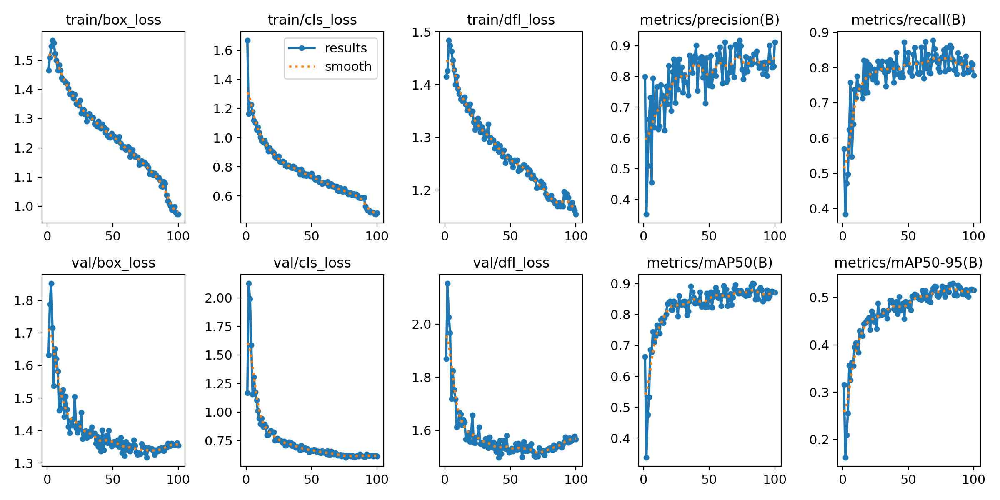


--- Confusion Matrix (dari Training Run) ---


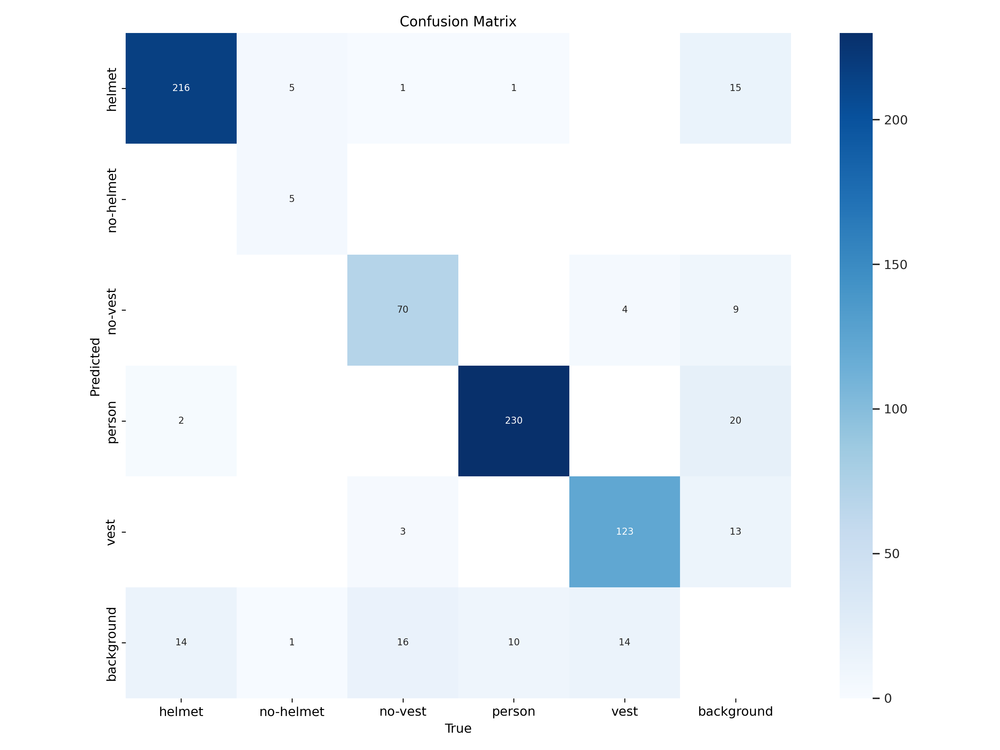

In [ ]:
from IPython.display import Image, display
import os

# Nama run yang Anda gunakan di 2.3
training_run_name = 'yolov12s_ppe_audit_v2'
run_dir = f'/content/yolov12/runs/detect/{training_run_name}/'

print(f"Menampilkan artifacts dari: {run_dir}\n")

# 1. Grafik Hasil (Loss, mAP, dll.)
results_path = os.path.join(run_dir, 'results.png')
if os.path.exists(results_path):
    print("--- Grafik Results (Loss & mAP) ---")
    display(Image(filename=results_path, width=800))
else:
    print("results.png tidak ditemukan.")

# 2. Confusion Matrix
cm_path = os.path.join(run_dir, 'confusion_matrix.png')
if os.path.exists(cm_path):
    print("\n--- Confusion Matrix (dari Training Run) ---")
    display(Image(filename=cm_path, width=600))
else:
    print("confusion_matrix.png tidak ditemukan.")

# Bab 4: Validasi & Penyimpanan Artifacts ke Drive

In [ ]:
from ultralytics import YOLO
import os
import shutil
import glob # Add this line to import the glob module

# --- 1. Tentukan Path ---
base_project_dir = "/content/drive/MyDrive/Colab Notebooks/purwadhika ai engineering/modul 4: computer vision/capstone 4"

# Path ke model terbaik yang baru saja Anda latih
model_path = os.path.join(base_project_dir, "models", "yolov12s_best_v2.pt")

# Path ke data.yaml
data_config_path = '/content/dataset/data.yaml'

# Path folder tujuan di GDrive untuk menyimpan artifacts
artifact_save_dir = os.path.join(base_project_dir, "validation_artifacts")
os.makedirs(artifact_save_dir, exist_ok=True)

# Path sementara di Colab untuk menyimpan hasil validasi
temp_val_project_dir = "/content/validation_runs"
temp_val_run_name = "final_validation_run"
temp_val_full_path = os.path.join(temp_val_project_dir, temp_val_run_name)

print(f"Folder artifacts GDrive disiapkan di: {artifact_save_dir}")

# --- 2. Muat Model ---
model = YOLO(model_path)

# --- 3. Jalankan Validasi ---
print("Memulai proses validasi...")
metrics = model.val(
    data=data_config_path,
    imgsz=640,
    batch=16,
    plots=True,
    project=temp_val_project_dir, # Simpan di folder sementara Colab
    name=temp_val_run_name
)

print(f"\n--- Hasil Metrik Validasi ---")
print(f"mAP50-95: {metrics.box.map:.4f}")
print(f"mAP50:    {metrics.box.map50:.4f}")
print("------------------------------")

# --- 4. Salin Artifacts ke Google Drive ---
print(f"\nMenyalin artifacts dari {temp_val_full_path} ke GDrive...")

# Salin semua file .png dan .jpg
file_types_to_copy = ("*.png", "*.jpg")
files_copied = 0

for file_type in file_types_to_copy:
    # Gunakan 'glob' untuk menemukan semua file yang cocok
    for file_path in glob.glob(os.path.join(temp_val_full_path, file_type)): # Changed os.glob to glob.glob
        file_name = os.path.basename(file_path)
        target_path = os.path.join(artifact_save_dir, file_name)

        # Salin file
        shutil.copy2(file_path, target_path)
        print(f"  -> Menyalin {file_name}...")
        files_copied += 1

print(f"\n✅ Selesai! {files_copied} artifacts telah disalin ke folder 'validation_artifacts' di Google Drive Anda.")

# Tampilkan isi folder GDrive untuk konfirmasi
!ls -l "{artifact_save_dir}"

Folder artifacts GDrive disiapkan di: /content/drive/MyDrive/Colab Notebooks/purwadhika ai engineering/modul 4: computer vision/capstone 4/validation_artifacts
Memulai proses validasi...
Ultralytics 8.3.63 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 376 layers, 9,076,143 parameters, 0 gradients, 19.3 GFLOPs


val: Scanning /content/dataset/valid/labels.cache... 119 images, 0 backgrounds, 0 corrupt: 100%|██████████| 119/119 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.45it/s]


                   all        119        715      0.885      0.837      0.905      0.536
                helmet        117        232      0.884      0.914      0.924      0.552
             no-helmet          6         11      0.914      0.636      0.831      0.417
               no-vest         52         90      0.837      0.789      0.875      0.457
                person        115        241      0.912      0.954      0.963       0.69
                  vest         74        141       0.88      0.894      0.932      0.563
Speed: 1.5ms preprocess, 14.7ms inference, 0.0ms loss, 4.4ms postprocess per image
Results saved to /content/validation_runs/final_validation_run2

--- Hasil Metrik Validasi ---
mAP50-95: 0.5356
mAP50:    0.9050
------------------------------

Menyalin artifacts dari /content/validation_runs/final_validation_run ke GDrive...
  -> Menyalin F1_curve.png...
  -> Menyalin PR_curve.png...
  -> Menyalin confusion_matrix.png...
  -> Menyalin R_curve.png...
  -> Menyali

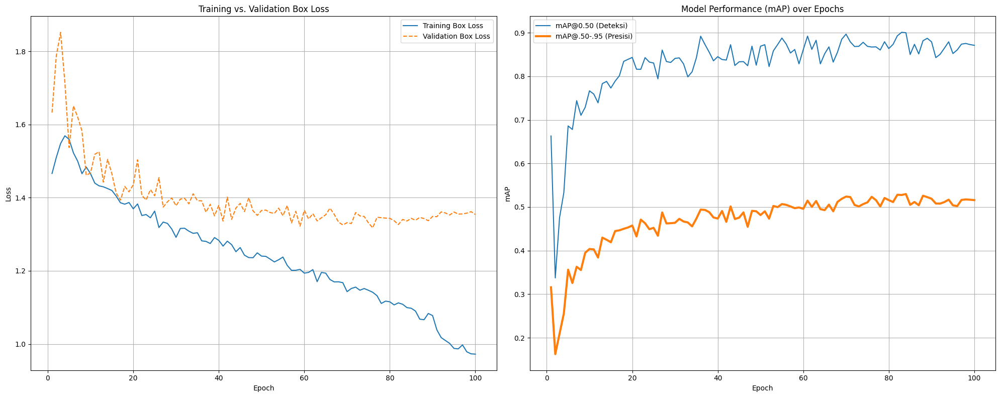

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Muat data Anda
csv_path = 'results.csv' # Pastikan nama file-nya cocok
try:
    data = pd.read_csv(csv_path)

    # 2. Membersihkan nama kolom (menghapus spasi)
    data.columns = data.columns.str.strip()

    # 3. Membuat Plot

    # Ukuran figur
    plt.figure(figsize=(20, 8))

    # --- Plot 1: Training vs Validation Loss (Untuk Cek Overfitting) ---
    plt.subplot(1, 2, 1)
    plt.plot(data['epoch'], data['train/box_loss'], label='Training Box Loss')
    plt.plot(data['epoch'], data['val/box_loss'], label='Validation Box Loss', linestyle='--')
    plt.title('Training vs. Validation Box Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # --- Plot 2: Performa mAP (Untuk Cek Good Fit) ---
    plt.subplot(1, 2, 2)
    plt.plot(data['epoch'], data['metrics/mAP50(B)'], label='mAP@0.50 (Deteksi)')
    plt.plot(data['epoch'], data['metrics/mAP50-95(B)'], label='mAP@.50-.95 (Presisi)', linewidth=3)
    plt.title('Model Performance (mAP) over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('mAP')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

except FileNotFoundError:
    print(f"Error: File '{csv_path}' tidak ditemukan. Silakan upload terlebih dahulu.")
except KeyError as e:
    print(f"Error: Kolom tidak ditemukan. Pastikan nama kolom di CSV Anda benar. Error: {e}")

### 4.1. Performa Run

📈 **Ringkasan Performa**

Perbedaan antara mAP50, mAP75, dan mAP50-95 ada di *strictness of the IoU thershold* yang digunakan untuk menentukan suatu deteksi benar atau salah.

Hasil overall dari `yolov12_best.pt` menunjukkan mAP50 sebesar 0.9050, artinya model ini sangat baik dalam **mendeteksi keberadaan suatu objek** dengan meletakkan *bounding box* di tempat yang tepat.

mAP50-95 artinya metric yang menghitung mAP dari range IoU 0.5 hingga 0.95. Dengan metric yang ketat ini, model yang meraih nilai di atas 0.5 (didapat 0.5356) sudah bisa dibilang sangat baik.

---

📊 **Analisis Kinerja per Kelas**

Jika dilihat per kelasnya, yang mana menjadi penting untuk case bisnis audit K3:

| Kelas | mAP50-95 (Presisi) | mAP50 (Deteksi) | Analisis |
|:---|:---:|:---:|---:|
| person | 0.690 | 0.963 (96.3%) | Luar Biasa. Model ini sangat confidence dalam mendeteksi person. |
| helmet | 0.552 | 0.924 (92.4%) | Sangat Baik. Model ini andal dalam mengenali helm. |
| vest | 0.563 | 0.932 (93.2%) | Sangat Baik. Model ini juga andal dalam mengenali rompi. |
| no-vest | 0.457 | 0.875 (87.5%) | Cukup Baik. Sedikit lebih rendah, tapi masih sangat bagus. |
| no-helmet | 0.417 | 0.831 (83.1%) | Titik Terlemah. Ini adalah kelas dengan performa terendah. |

Model ini **sangat baik** dalam mendeteksi *kepatuhan* (`person`, `helmet`, `vest`).

Tetapi titik terlemahnya (meskipun tergolong baik di mAP50) adalah dalam mendeteksi *pelanggaran*, terutama `no-helmet`. Kemungkinan penyebabnya adalah **data imbalance** dimana pada dataset mungkin memiliki banyak sekali gambar `helmet` tetapi hanya sedikit sekali contoh gambar `no-helmet`.

Saat nanti  dibuat logika audit K3, harus disadari bahwa model ini mungkin akan melewatkan beberapa kasus `no-helmet` (false negative)

---

👟 **Grafik Kiri (Training vs. Validation Loss)**

* **Apa yang Dilihat:** Grafik ini membandingkan *error* (loss) model pada data *training* (yang dihafal) vs. data *validasi* (yang "baru").
* **Observasi "Spike" Awal:** Lonjakan (spike) *loss* di epoch awal (sekitar epoch 5-10) adalah hal yang **normal**. Ini adalah saat di mana *optimizer* (AdamW) dan *learning rate* sedang "mencari pijakan" di akhir fase *warm-up*. Model mungkin mencoba langkah pembelajaran yang terlalu agresif, *error*-nya melonjak, lalu *optimizer* segera mengoreksi diri dan kembali ke jalur yang benar.
* **Bukti "Good Fit":**
    1.  **Tidak Underfit:** Kedua kurva turun drastis, yang berarti model berhasil belajar (bukan *underfit*).
    2.  **Tidak Overfit:** Ini yang terpenting. Perhatikan bagaimana kurva *Validation Loss* (oranye) **selalu mengikuti** kurva *Training Loss* (biru). Keduanya turun bersamaan.
    3.  **Tanda *Overfitting* (yang tidak terlihat)** adalah jika garis biru (Training) terus turun, sementara garis oranye (Validasi) mulai **naik kembali**. Karena itu tidak terjadi, model ini memiliki *generalisasi* yang sangat baik, walaupun mungkin di epoch yang lebih banyak, garis oranye terus naik.

---

🏃‍➡️ **Grafik Kanan (Model Performance mAP)**

* **Apa yang Dilihat:** Grafik ini menunjukkan seberapa "pintar" model ini seiring berjalannya waktu.
* **Observasi "Drop" Awal:** Penurunan (drop) mAP di awal **secara langsung disebabkan oleh "Spike" Loss** dari grafik kiri.
    * **Hubungannya:** `Loss` (Error) adalah kebalikan dari `mAP` (Performa).
    * Saat *Loss* (error) melonjak naik di epoch 5-10, performa `mAP` (akurasi) model secara logis **jatuh** untuk sementara.
    * Begitu *optimizer* memperbaiki *loss* (grafik kiri turun lagi), performa `mAP` (grafik kanan) langsung **melonjak kembali** dan melanjutkan proses belajarnya.
* **Bukti "Good Fit":**
    * Kurva `mAP@.50-.95` (oranye) menunjukkan model mencapai performa puncaknya (sekitar 0.53) di sekitar epoch 80-90, dan kemudian mulai stagnan atau sedikit turun.
    * Ini **sempurna**. Ini membuktikan bahwa *framework* ini berhasil menyimpan `best.pt` tepat pada **puncak performa** (epoch 84, dari log run) sebelum model mulai *overfitting* di 10-15 epoch terakhir.

Kedua grafik tersebut bila dibaca bersamaan, adalah **bukti sempurna** bahwa proses *training* **berhasil** dan model `best.pt` yang terpilih adalah model yang **"Good Fit"**. Keanehan di awal hanyalah bagian normal dari proses stabilisasi *optimizer* di awal *training*.

### 4.2. Analisis Confusion Matrix

Menampilkan artifacts dari: /content/drive/MyDrive/Colab Notebooks/purwadhika ai engineering/modul 4: computer vision/capstone 4/validation_artifacts

---Confusion Matrix---


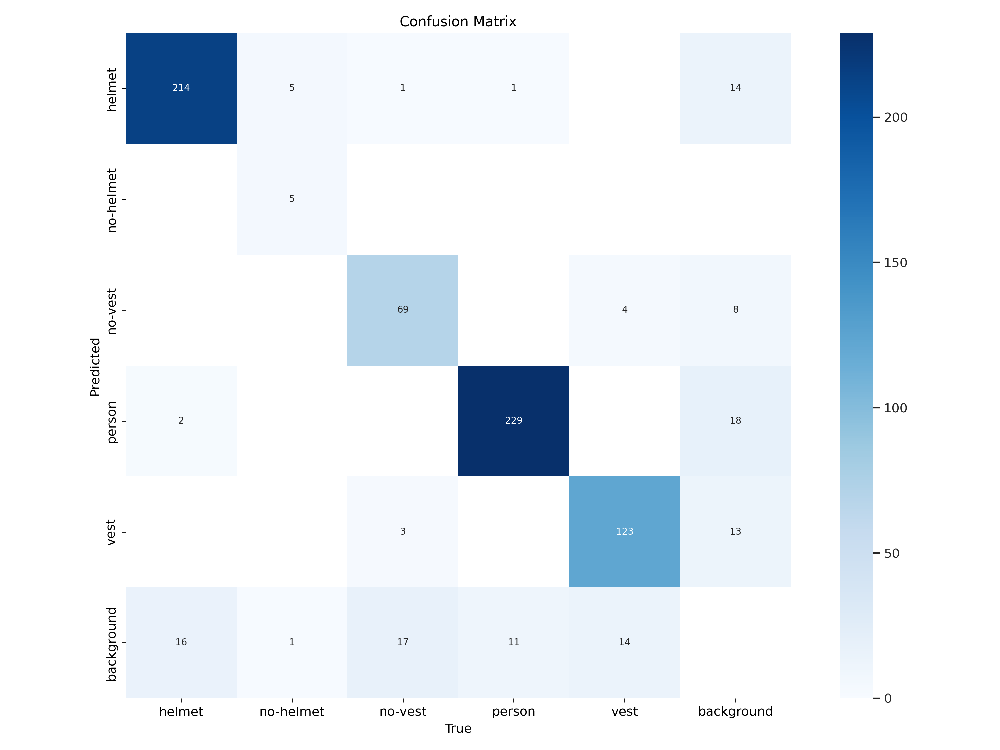

In [ ]:
from IPython.display import Image, display
import os

# Path ke folder hasil validasi
val_run_dir = '/content/drive/MyDrive/Colab Notebooks/purwadhika ai engineering/modul 4: computer vision/capstone 4/validation_artifacts'

print(f"Menampilkan artifacts dari: {val_run_dir}\n")

# 1. Confusion Matrix
print("---Confusion Matrix---")
cm_path = os.path.join(val_run_dir, "confusion_matrix.png")
if os.path.exists(cm_path):
    display(Image(filename=cm_path))
else:
  print("Confusion Matrix tidak ditemukan.")

📈 **Analisis Performa Model**

Secara keseluruhan, hasilnya menunjukkaan performa yang kuat dalam mengidentifikasi `person`, `helmet`, dan `vest`. Dari angka yang ada di diagonal, terlihat kotak berwarna gelap yang menunjukkan prediksi-prediksi kelas yang benar:
- `person`: 229 benar
- `helmet`: 214 benar
- `vest`: 123 benar

Model hampir **tidak pernah salah** membedakan `person`  dengan `helmet`  atau `person` dengan `vest`. Hal ini ideal untuk logika audit K3 karena dengan ini dapat dibedakan dengan percaya diri antara APD dengan pekerja.

---

⚠️ **Weak Spots**

Namun ada masalah di mana kelas `no-helmet` memiliki performa yang buruk, model hanya berhasil mendeteksi 5 kasus `no-helmet` dengan benar. Bahkan ada kesalahan fatal dimana model salah mengklasifikasikan 5 kasus `no-helmet` sebagai `helmet`. Ini adalah *false negative* yang paling berbahaya untuk audit K3 (menganggap pelanggaran sebagai kepatuhan).

Kemungkinan penyebab terbesarnya adalah **data yang sangat tidak seimbang**. Jika dilihat total dataset validasi, hanya ada 11 contoh `no-helmet` (5+5+1). Model tidak memiliki cukup data untuk mempelajari cara mendeteksi pelanggaran ini dengan andal.

Masalah berikutnya ada di `background`. Istilah "background" di sini mengacu pada objek yang salah dideteksi (False Positive) atau terlewat (False Negative). Objek yang Terlewat: Lihat baris "background" (Predicted). Ini adalah objek yang seharusnya dideteksi tetapi terlewat (model menganggapnya sebagai background):

- 16 `helmet` terlewat.
- 17 `no-vest` terlewat.
- 11 `person` terlewat.
- 14 `vest` terlewat.

Deteksi Salah: Lihat kolom "background" (True). Ini adalah saat background asli salah dideteksi sebagai objek:
- 18 kali `background` dikira `person`.
- 14 kali `background` dikira `helmet`.
- 13 kali `background` dikira `vest`.

---

⏭️ **Kesimpulan untuk Performa Umum Untuk Proyek Ini**

Oleh karena itu, untuk proyek audit K3 ini, secara umum akan aman karena untuk tiap pekerja yang berhasil dideteksi, model ini tidak bingung antara `person`, `helmet`, dan `vest`. Namun harus diakui keterbatasannya yaitu model ini akan melewatkan beberapa pekerja (dikira `background`), dan sangat tidak andal dalam mendeteksi pelanggaran `no-helmet`.

### 4.3. F1 Curve


---Kurva F1---


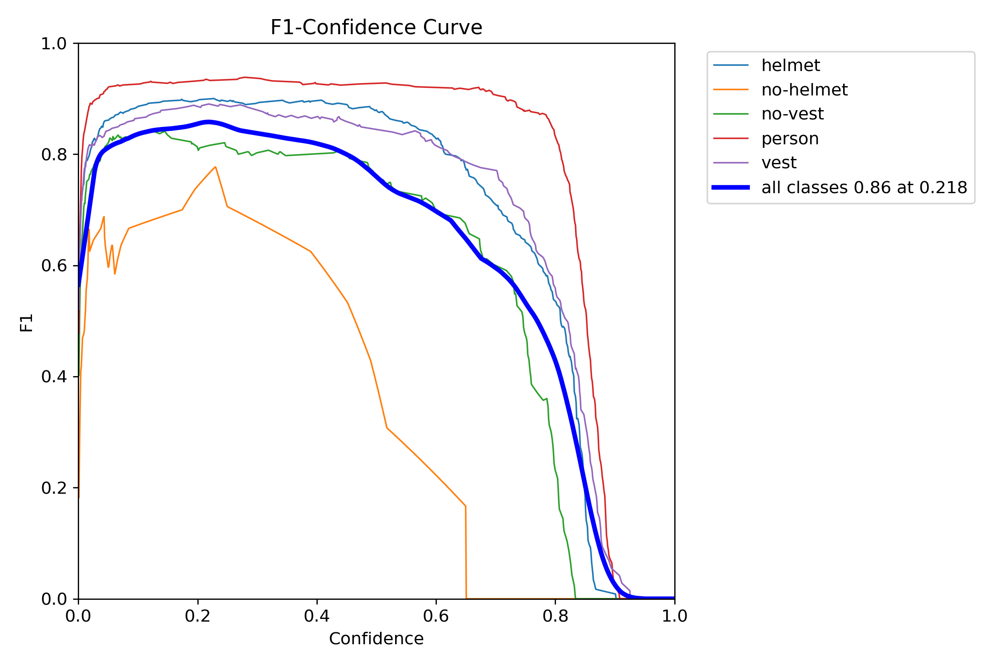

In [ ]:
# 2. Kurva F1
print("\n---Kurva F1---")
f1_curve_path = os.path.join(val_run_dir, "F1_curve.png")
if os.path.exists(f1_curve_path):
    display(Image(filename=f1_curve_path, width=600))
else:
  print("Kurva F1 tidak ditemukan.")

🎯 **Apa Arti Kurva F1-Confidence Ini?**

Pertama ditinjau kurva F1-confidence, yaitu keseimbangan presisi & recall dan confience threshold (tingkat keyakinan model).
- Sumbu Y (F1): Seberapa "baik" performa model secara keseluruhan. Semakin tinggi (mendekati 1.0), semakin baik.
- Sumbu X (Confidence): "Batas" yang ditetapkan. Jika diatur di 0.7, model hanya akan melaporkan deteksi yang keyakinannya > 70%.

📊 **Analisis Kinerja**
1. **Titik Puncak (Overall):** Lihat legenda: "all classes 0.86 at 0.218". Ini adalah temuan utamanya. Performa model terbaik (F1 score = 0.86) secara rata-rata untuk semua kelas, dicapai saat menggunakan confidence threshold yang sangat rendah, yaitu 0.218.

2. **Performa per Kelas (Sesuai Dugaan)**:

- Kelas Kuat (person, helmet, vest): Kurva merah, biru, dan ungu berada di paling atas. Mereka memiliki F1 score tinggi (>0.8) di hampir semua rentang confidence sebelum akhirnya turun di ~0.85. Ini sangat bagus.

- Kelas Lemah (no-helmet): Kurva oranye buruk, yang mengkonfirmasi temuan sebelumnya di confusion matrix. F1 score-nya rendah dan "jatuh" sangat cepat. Jika diatur confidence di atas 0.4, performa kelas ini hancur.

---

💡 **Kesimpulan & Tindakan untuk Bab 3**

- Di mana "Confidence Threshold" yang Ideal?

  - Grafik ini menyarankan sweet spot teknis ada di 0.218.
  - Namun, menggunakan threshold serendah itu dapat menyebabkan banyak false positives (model terlalu sensitif).

- Saran Praktis:
  - Melihat di Confidence = 0.4 (sumbu X):
    - F1 score overall (biru tebal) masih sangat tinggi (~0.82).
    - Kelas person, helmet, dan vest masih sangat baik.
    - Kelas no-helmet belum "jatuh" sepenuhnya.

Jadi, confidence threshold antara 0.3 dan 0.4 adalah pilihan yang sangat baik dan praktis, menyeimbangkan antara menemukan sebagian besar objek (Recall) dan tidak terlalu banyak salah deteksi (Precision).



### 4.4. Precision Curve


---Kurva Precision (P)---


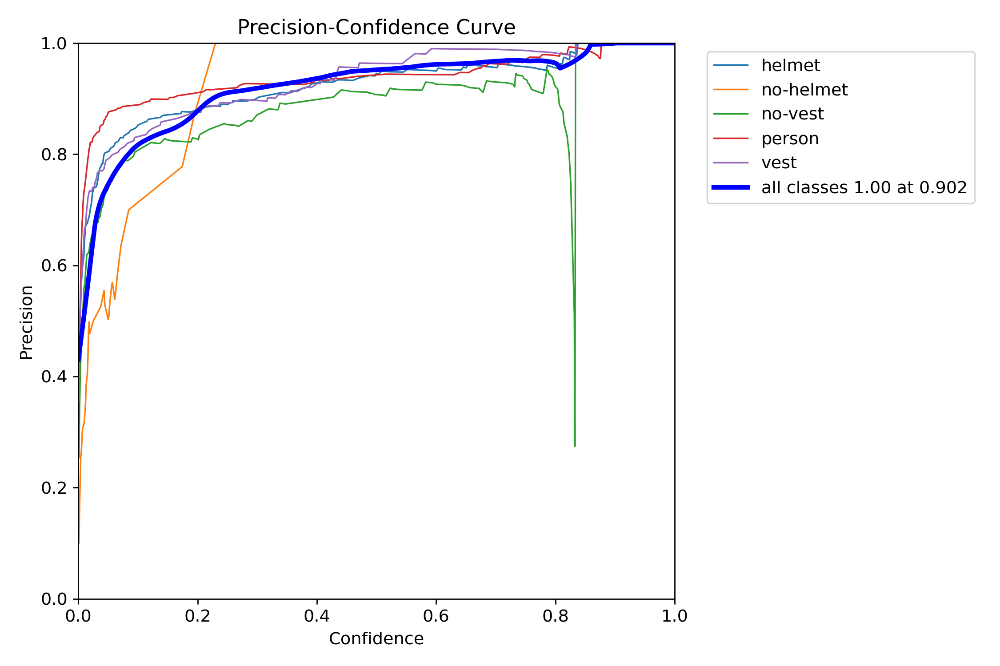

In [ ]:
# 3. Kurva P
print("\n---Kurva Precision (P)---")
p_curve_path = os.path.join(val_run_dir, "P_curve.png")
if os.path.exists(p_curve_path):
    display(Image(filename=p_curve_path, width=600))
else:
  print("Kurva P tidak ditemukan.")

🎯 **Apa Arti Kurva P Ini?**

Grafik ini (Precision-Confidence Curve) menunjukkan seberapa **"bisa dipercaya"** prediksi model.

* **Sumbu Y (Precision):** Dari semua yang dideteksi model (misal, 10 `helmet`), berapa persen yang *benar-benar* `helmet`? Jika 9/10 benar, Precision = 0.9.
* **Sumbu X (Confidence):** Tingkat keyakinan model saat membuat prediksi itu.

Idealnya, saat *Confidence* (Sumbu X) naik, *Precision* (Sumbu Y) juga naik. Model yang lebih yakin seharusnya lebih sering benar.

---

📈 **Temuan 1: Garis Biru (All Classes) Naik ke 1.0**

* **Apa Artinya:** Jika dilihat legenda: **"all classes 1.00 at 0.902"**. Ini berarti, jika mengabaikan *semua* prediksi model yang keyakinannya (confidence) di bawah 0.902 (90.2%), maka **100% dari prediksi yang tersisa PASTI BENAR.**
* **Mengapa 100%?** Ini berarti model kita tidak menghasilkan **satu pun** *False Positive* (deteksi salah) pada tingkat keyakinan setinggi itu. Setiap kali model berkata "Saya 91% yakin ini helm," model itu 100% benar.
* **Kenapa Sempat Turun?** Ada sedikit "lembah" di sekitar 0.8. Ini adalah **efek rata-rata**. Garis biru tebal adalah *rata-rata* dari semua garis lainnya. "Jatuhnya" garis hijau (`no-vest`) secara drastis di 0.8 menarik rata-rata (garis biru) ke bawah bersamanya. Setelah anomali garis hijau itu lewat, rata-ratanya pulih dan naik ke 1.0.

---

📉 **Temuan 2: Garis Hijau ("no-vest") Jatuh Drastis**

Ini adalah wawasan terpenting dari grafik ini dan **mengkonfirmasi masalah sebelumnya** dari *confusion matrix*.

* **Apa Artinya:** Precision = `Benar / (Benar + Salah Deteksi)`. Satu-satunya cara agar Precision (Sumbu Y) bisa "jatuh" secara vertikal adalah jika jumlah **Salah Deteksi** (False Positive) tiba-tiba **meledak** pada titik *confidence* (Sumbu X) tersebut.
* **Terjemahan Sederhana:**
    1.  Pada *Confidence* 0.79, presisi `no-vest` sangat tinggi (mungkin ~0.95 atau 95%). Model sangat bisa dipercaya.
    2.  **Tepat di *Confidence* 0.8**, presisi `no-vest` *jatuh* ke ~0.28.
    3.  Ini berarti di *dataset* validasi, ada **sekumpulan besar deteksi salah (False Positive)** yang semuanya diberi *confidence* oleh model di rentang yang sangat sempit, yaitu ~0.8 (misal, 0.801, 0.802, 0.803).
    4.  Contoh: Model melihat 10 bayangan atau tas, dan dengan sangat yakin berkata "Saya 80% yakin ini `no-vest`!". Saat *threshold* model melewati 0.8, "banjir" deteksi salah ini tiba-tiba masuk ke dalam perhitungan, dan nilai Precision-nya hancur.

---

🎯 **Kesimpulan Praktis untuk Bab 3**

* Kedua grafik (F1 dan P) menceritakan kisah yang sama: Model ini **sangat kuat** untuk kelas `person`, `helmet`, dan `vest`.
* Model ini **memiliki masalah** dengan kelas `no-vest` (dan `no-helmet`), di mana ia bisa tiba-tiba sangat yakin tentang deteksi yang salah.
* Ini **memperkuat keputusan kita** untuk **TIDAK** menggunakan *confidence threshold* yang tinggi. Jika diatur di 0.8, kita akan menghancurkan performa deteksi `no-vest`.
* Menetapkan *threshold* di **Bab 3.4** pada **`0.4`** adalah pilihan yang **jauh lebih aman**. Pada titik itu, semua kurva masih stabil dan memiliki presisi yang baik.



### 4.5. Recall Curve


---Kurva Recall (R)---


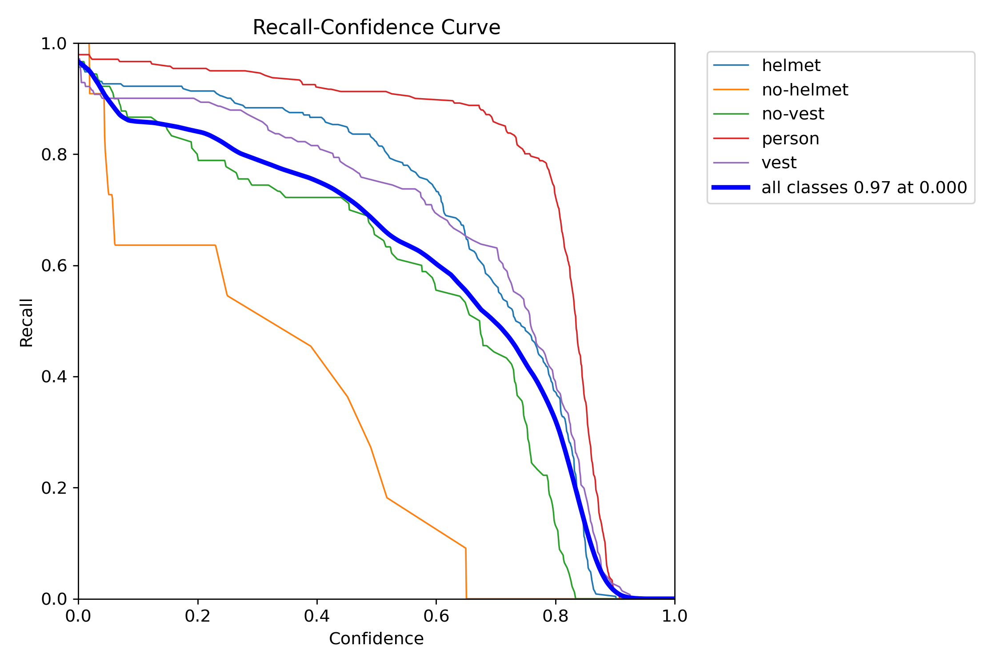

In [ ]:
# 4. Kurva R
print("\n---Kurva Recall (R)---")
r_curve_path = os.path.join(val_run_dir, "R_curve.png")
if os.path.exists(r_curve_path):
  display(Image(filename=r_curve_path, width=600))
else:
  print("Kurva R tidak ditemukan.")

Kurva ini (Recall-Confidence Curve) adalah tentang **"seberapa teliti"** model dalam menemukan objek.

* **Sumbu Y (Recall):** Dari semua objek yang *sebenarnya ada* di gambar (misal, ada 10 `helmet`), berapa persen yang *berhasil ditemukan* oleh model? Jika model menemukan 9, Recall-nya 0.9 (90%).
* **Sumbu X (Confidence):** Tingkat keyakinan model.

**Inti Cerita:** Idealnya, Recall (Sumbu Y) tetap tinggi meskipun Confidence (Sumbu X) meningkat.

---

📊 **Analisis Makna Kurva**

1.  **Apa Artinya "all classes 0.97 at 0.000"?**
    Ini adalah titik *recall* maksimum model. Artinya: "Jika kita menerima *setiap* deteksi yang dibuat model (bahkan yang keyakinannya 0.001%), model akan berhasil menemukan **97%** dari semua objek yang ada." 3% sisanya terlewatkan (False Negatives).

2.  **Trade-off yang Jelas:**
    Lihat bagaimana **semua kurva hanya bisa turun** ke kanan. Ini adalah *trade-off* alami:
    * Semakin "pemilih" model ini diatur (menaikkan *confidence threshold*),
    * Semakin banyak deteksi yang dibuang,
    * Semakin rendah *recall* model (karena model mungkin membuang deteksi yang benar tapi *confidence*-nya rendah).

3.  **Performa Kelas (Lagi-lagi Konfirmasi):**
    * **Kelas Kuat (`person`, `helmet`, `vest`):** Garis merah, biru, dan ungu turunnya landai. Lihat garis `person` (merah): *recall*-nya masih di atas 0.8 (80%) bahkan saat *confidence* 0.8! Ini luar biasa. Artinya, model ini menemukan *sebagian besar* pekerja dan **sangat yakin** saat menemukannya.
    * **Kelas Lemah (`no-helmet`, `no-vest`):** Garis oranye (`no-helmet`) dan hijau (`no-vest`) **jatuh terjun bebas**. Lihat garis `no-helmet` (oranye): *recall*-nya langsung anjlok. Jika kita menetapkan *threshold* di 0.2 saja, kita sudah kehilangan 35% *recall* (dari 0.97 ke 0.63).

---

🎯 **Kesimpulan dari 3 Kurva**

* **Confusion Matrix** memberi tahu kita: Model **sangat buruk** dalam membedakan `no-helmet` (banyak yang salah dikira `helmet`).
* **Precision Curve (P)** memberi tahu kita: Model **tidak bisa dipercaya** saat mendeteksi `no-vest` di *confidence* tinggi.
* **Recall Curve (R)** ini memberi tahu kita: Model **tidak yakin** saat mendeteksi `no-helmet`. Untuk menemukannya, kita *harus* menggunakan *confidence threshold* yang rendah.

Ini semua memperkuat keputusan kita: Kita harus menggunakan **confidence threshold yang relatif rendah (misal, 0.4)** di **Bab 3**. Ini adalah kompromi terbaik untuk tetap bisa menemukan pelanggaran (`no-helmet`, `no-vest`) tanpa terlalu banyak mendapat deteksi salah.



### 4.6. Precision-Recall Curve


---Kurva Precision-Recall (PR)---


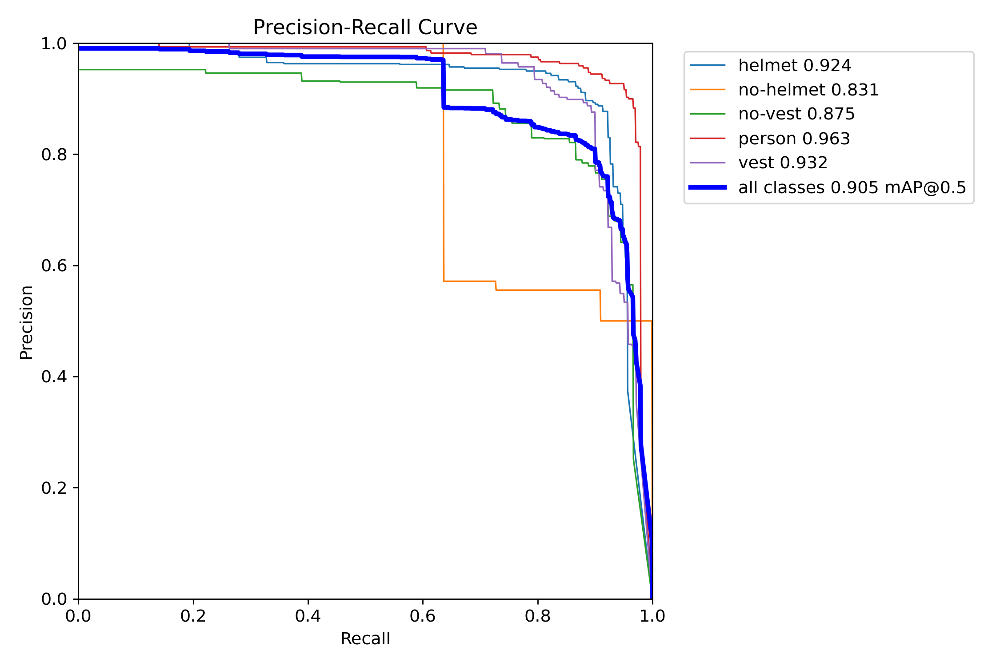

In [ ]:
# 5. Kurva PR
print("\n---Kurva Precision-Recall (PR)---")
pr_curve_path = os.path.join(val_run_dir, "PR_curve.png")
if os.path.exists(pr_curve_path):
  display(Image(filename=pr_curve_path, width=600))
else:
  print("Kurva PR tidak ditemukan.")

Ini adalah *summary curve* yang paling penting, dan ini adalah hasil yang baik.

🎯 **Interpretasi Utama: Performa Model Sangat Baik**

Grafik ini (Precision-Recall Curve) adalah rangkuman dari dua grafik sebelumnya. Ini adalah metrik utama untuk menilai model *object detection*.

* **Sumbu Y (Precision):** Seberapa akurat deteksi model? (Minim *False Positives*).
* **Sumbu X (Recall):** Seberapa teliti deteksi model? (Minim *False Negatives* / objek terlewat).

Garis melengkung menunjukkan *trade-off* antara keduanya. Idealnya, kita ingin kurva yang "sedekat mungkin" ke sudut kanan atas (Precision=1.0, Recall=1.0).

---

📊 **Analisis Makna Kurva**

1.  **Skor Utama: "all classes 0.905 mAP@0.5"**
    * Inilah intinya. **mAP (mean Average Precision)** adalah "Area di Bawah Kurva" (AUC) ini, dirata-rata untuk semua kelas.
    * Skor mAP **0.905 (atau 90.5%)** adalah **hasil yang luar biasa**. Ini menegaskan bahwa model ini memiliki keseimbangan yang sangat baik antara akurasi dan ketelitian.

2.  **Performa per Kelas (Konfirmasi Penuh)**
    * **Kelas Kuat (`person`, `vest`, `helmet`):** Garis merah (0.963), ungu (0.932), dan biru (0.924) memiliki area di bawah kurva yang sangat besar. Mereka terlihat seperti "kotak" yang ideal, yang menunjukkan performa yang sangat stabil dan andal.
    * **Kelas Lemah (`no-helmet`):** Garis oranye (0.831) dengan jelas memiliki area di bawah kurva yang paling kecil. Bisa dilihat "langkah" di mana kurva turun tajam. Ini adalah representasi visual dari masalah yang kita lihat di *confusion matrix*: model berusaha untuk mempertahankan *precision* saat mencoba menemukan semua contoh `no-helmet`.

💡 **Kesimpulan Curves**

* Model ini memiliki **metrik tunggal (mAP = 90.5%)** yang membuktikan bahwa model ini memiliki performa **sangat tinggi**.
* Grafik ini merangkum semua yang telah kita lihat: model ini **brilian** dalam mendeteksi `person`, `helmet`, dan `vest`, namun memiliki **kelemahan yang terukur** pada kelas `no-helmet`.



--- Contoh Hasil Validasi (Batch 0)---


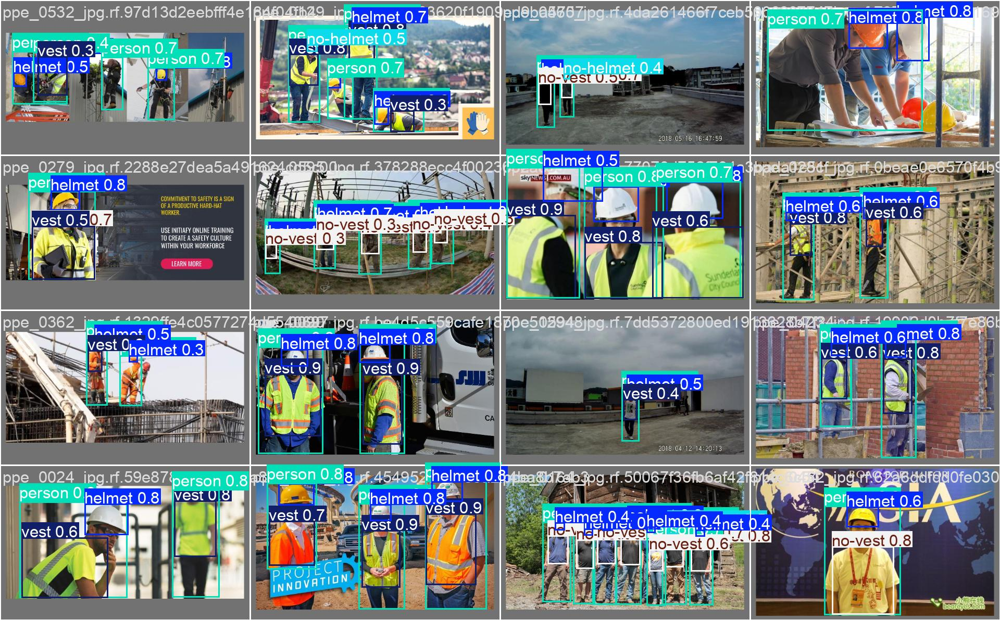

In [ ]:
# 6. Hasil Prediksi per Batch (contoh)
print("\n--- Contoh Hasil Validasi (Batch 0)---")
val_batch_path = os.path.join(val_run_dir, "val_batch0_pred.jpg")
if os.path.exists(val_batch_path):
  display(Image(filename=val_batch_path, width=800))
else:
  print("val_batch0_pred.jpg tidak ditemukan")

# Bab 5: Pengembangan Logika Analisis (Post-Processing)

Tujuan bab ini adalah membangun fungsi-fungsi Python yang akan menjadi inti dari aplikasi Streamlit. Model `best.pt` hanya memberikan *output* berupa koordinat *bounding box* dan kelas (misal, `person` di [x,y,w,h]).

Logika di bab inilah yang akan:

1.  Mengasosiasikan APD (`helmet`, `vest`) dengan `person` yang spesifik.
2.  Menghasilkan "Laporan Kepatuhan" (Compliance Report).
3.  Menerapkan "Tingkat Keparahan Pelanggaran" (Severity Level).
4.  Menerapkan "Privacy Blurring" (Anonimisasi).

## 5.1. Memuat Model (Inference Mode) dari Google Drive

Pertama, kita muat kembali model `best.pt` yang sudah disimpan di Google Drive. Ini akan mensimulasikan bagaimana aplikasi Streamlit nanti akan memuat model.

In [1]:
from ultralytics import YOLO
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Untuk menampilkan gambar di Colab
import os

# 1. Tentukan path ke model best v2
model_path = "/content/drive/MyDrive/Colab Notebooks/purwadhika ai engineering/modul 4: computer vision/capstone 4/models/yolov12s_best_v2.pt"

# 2. Muat model
try:
    model = YOLO(model_path)
    print(f"✅ Model berhasil dimuat dari: {model_path}")
except Exception as e:
    print(f"Error memuat model: {e}")

# 3. Tentukan path ke gambar uji
test_image_path = '/content/dataset/test/images/ppe_0038_jpg.rf.baf07f7ec6f9fdc82334d58a5a1e6db4.jpg' # <-- GANTI GAMBAR DISINI
print(f"ℹ️ Gambar uji diatur ke: {test_image_path}")

FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
✅ Model berhasil dimuat dari: /content/drive/MyDrive/Colab Notebooks/purwadhika ai engineering/modul 4: computer vision/capstone 4/models/yolov12s_best_v2.pt
ℹ️ Gambar uji diatur ke: /content/dataset/test/images/ppe_0038_jpg.rf.baf07f7ec6f9fdc82334d58a5a1e6db4.jpg


> **Catatan:** Ganti `your_test_image.jpg` dengan nama *file* gambar dari folder `/content/dataset/test/images/` untuk melakukan pengujian.

## 3.2. Fungsi Bantuan: Perhitungan IoU (Intersection over Union)

Untuk mengasosiasikan `helmet` dengan `person`, kita perlu tahu apakah *box* mereka tumpang tindih (overlap). Kita akan menggunakan metrik standar **Intersection over Union (IoU)**. Fungsi ini adalah alat bantu teknis yang akan kita perlukan di langkah berikutnya.

In [2]:
def calculate_iou(box1, box2):
    """
    Menghitung Intersection over Union (IoU) antara dua bounding box.
    Format box: [x1, y1, x2, y2]
    """
    # Tentukan koordinat (x, y) dari area irisan (intersection)
    xA = max(box1[0], box2[0])
    yA = max(box1[1], box2[1])
    xB = min(box1[2], box2[2])
    yB = min(box1[3], box2[3])

    # Hitung luas area irisan
    inter_area = max(0, xB - xA) * max(0, yB - yA)

    # Hitung luas kedua box
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    # Hitung IoU
    iou = inter_area / float(box1_area + box2_area - inter_area)

    return iou

## 3.3. Logika Inti: Fungsi Audit K3 (PPE Audit Function)

Ini adalah fungsi utama. Fungsi ini akan menerima hasil deteksi mentah dari model dan mengubahnya menjadi laporan yang dapat dibaca. Ini mencakup asosiasi APD, penentuan level keparahan, dan *privacy blurring*.

In [3]:
def run_ppe_audit(model_results, image_bgr, confidence_threshold=0.5, blur_heads=True):
    """
    Memproses hasil deteksi model dan melakukan audit K3.

    Args:
    - model_results: Hasil dari model.predict()
    - image_bgr: Gambar asli dalam format OpenCV (BGR)
    - confidence_threshold: Ambang batas kepercayaan (dari analisis kurva kita)

    Returns:
    - compliance_report (list): Daftar dictionary berisi status setiap pekerja.
    - annotated_image (numpy.ndarray): Gambar yang sudah diberi anotasi dan blur.
    """

    # 1. Salin gambar untuk anotasi dan blurring
    annotated_image = image_bgr.copy()

    # 2. Ekstraksi data dari hasil model
    boxes_object = model_results[0].boxes # Bounding boxes

    # Daftar untuk menyimpan deteksi yang sudah difilter
    persons = []
    helmets = []
    vests = []
    no_helmets = []
    no_vests = []

    # 3. Pisahkan deteksi berdasarkan kelas dan confidence
    for box in boxes_object:
        class_id = int(box.cls[0])
        conf = float(box.conf[0])
        # FIX: Convert the tensor to a NumPy array before using .astype(int)
        coords = box.xyxy[0].cpu().numpy().astype(int) # [x1, y1, x2, y2]

        if conf < confidence_threshold:
            continue # Abaikan deteksi dengan kepercayaan rendah

        class_name = model.names[class_id]

        if class_name == 'person':
            persons.append(coords)

            # [Fitur Privacy Blurring]
            if blur_heads:
              (x1, y1, x2, y2) = coords

              # 1. Hitung tinggi 'head' (asumsi 25% dari total tinggi)
              person_height = y2 - y1
              head_height = int(person_height * 0.25)

              # 2. Tentukan koordinat y untuk 'head_box'
              head_y1 = y1
              head_y2 = y1 + head_height # Hanya sampai 25% ke bawah

              # 3. Pastikan koordinat tidak di luar batas gambar
              head_y1, head_y2 = max(0, head_y1), min(annotated_image.shape[0], head_y2)
              x1, x2 = max(0, x1), min(annotated_image.shape[1], x2)

              # 4. Hanya terapkan blur jika areanya valid
              if head_y1 < head_y2 and x1 < x2:
                  # 5. Ambil ROI (Region of Interest) hanya untuk kepala
                  head_roi = annotated_image[head_y1:head_y2, x1:x2]

                  # 6. Terapkan blur
                  blurred_roi = cv2.GaussianBlur(head_roi, (51, 51), 0)

                  # 7. Tempatkan kembali ROI yang sudah di-blur ke gambar
                  annotated_image[head_y1:head_y2, x1:x2] = blurred_roi

        elif class_name == 'helmet':
            helmets.append(coords)
        elif class_name == 'vest':
            vests.append(coords)
        elif class_name == 'no-helmet':
            no_helmets.append(coords)
        elif class_name == 'no-vest':
            no_vests.append(coords)

    # 4. Logika Asosiasi dan Audit
    compliance_report = []
    person_id = 0

    for p_box in persons:
        person_id += 1
        status = {
            "id": f"Pekerja {person_id}",
            "has_helmet": False,
            "has_vest": False,
            "no_helmet_detected": False,
            "no_vest_detected": False,
            "box": p_box
        }

        # Cek Asosiasi Helmet
        for h_box in helmets:
            if calculate_iou(p_box, h_box) > 0.1: # IoU threshold > 10%
                status["has_helmet"] = True
                break

        # Cek Asosiasi Vest
        for v_box in vests:
            if calculate_iou(p_box, v_box) > 0.2: # IoU threshold > 20%
                status["has_vest"] = True
                break

        # Cek Asosiasi 'no-helmet' dan 'no-vest' (jika ada)
        # Ini menambah keyakinan pada deteksi pelanggaran
        for nh_box in no_helmets:
            if calculate_iou(p_box, nh_box) > 0.1:
                status["no_helmet_detected"] = True
        for nv_box in no_vests:
            if calculate_iou(p_box, nv_box) > 0.1:
                status["no_vest_detected"] = True

        compliance_report.append(status)

    # 5. [Fitur Severity Level]
    # Tambahkan anotasi (teks & kotak) pada gambar yang sudah di-blur
    for report in compliance_report:
        p_box = report["box"]
        (x1, y1, x2, y2) = p_box

        # Tentukan status akhir dan warna
        is_safe = report["has_helmet"] and report["has_vest"]
        is_critical = not report["has_helmet"] or report["no_helmet_detected"]
        is_warning = not report["has_vest"] or report["no_vest_detected"]

        # Logika Penentuan Status
        if is_critical:
            status_text = "BAHAYA (Helm)"
            color = (0, 0, 255) # Merah
        elif is_warning and not is_critical: # Hanya 'warning' jika 'critical' tidak terpenuhi
            status_text = "PERINGATAN (Rompi)"
            color = (0, 255, 255) # Kuning
        else:
            status_text = "AMAN"
            color = (0, 255, 0) # Hijau

        # Gambar Bounding Box 'person' (di atas blur)
        cv2.rectangle(annotated_image, (x1, y1), (x2, y2), color, 2)

        # Gambar Label Status
        cv2.putText(annotated_image,
                    f"{report['id']}: {status_text}",
                    (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.7, color, 2)

    return compliance_report, annotated_image

## 3.4. Uji Coba Logika Audit

Terakhir, kita jalankan semua logika yang telah dibuat pada gambar uji. Ini akan menunjukkan *output* akhir yang akan kita tampilkan di Streamlit.


Menjalankan prediksi model...
Menjalankan fungsi audit K3...

--- 🕵️‍♂️ LAPORAN KEPATUHAN K3 ---
  ID: Pekerja 1
    - Punya Helm? ❌
    - Punya Rompi? ✅
  ID: Pekerja 2
    - Punya Helm? ✅
    - Punya Rompi? ✅
  ID: Pekerja 3
    - Punya Helm? ✅
    - Punya Rompi? ✅
  ID: Pekerja 4
    - Punya Helm? ✅
    - Punya Rompi? ✅
---------------------------------

Menampilkan Gambar Asli (KIRI) vs. Hasil Audit (KANAN)...


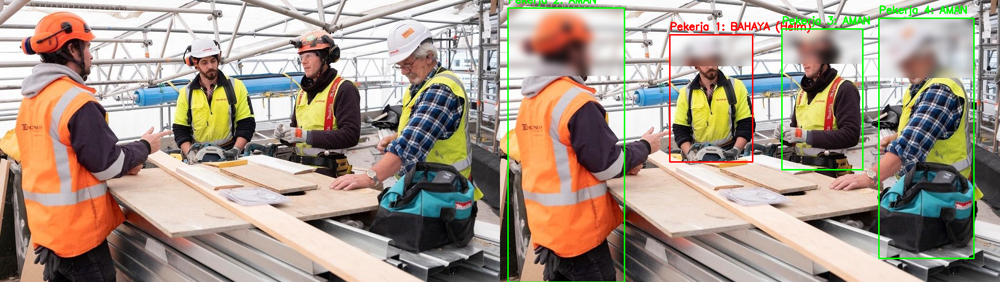

--- 1. Menjalankan Uji Coba (Blur AKTIF) ---


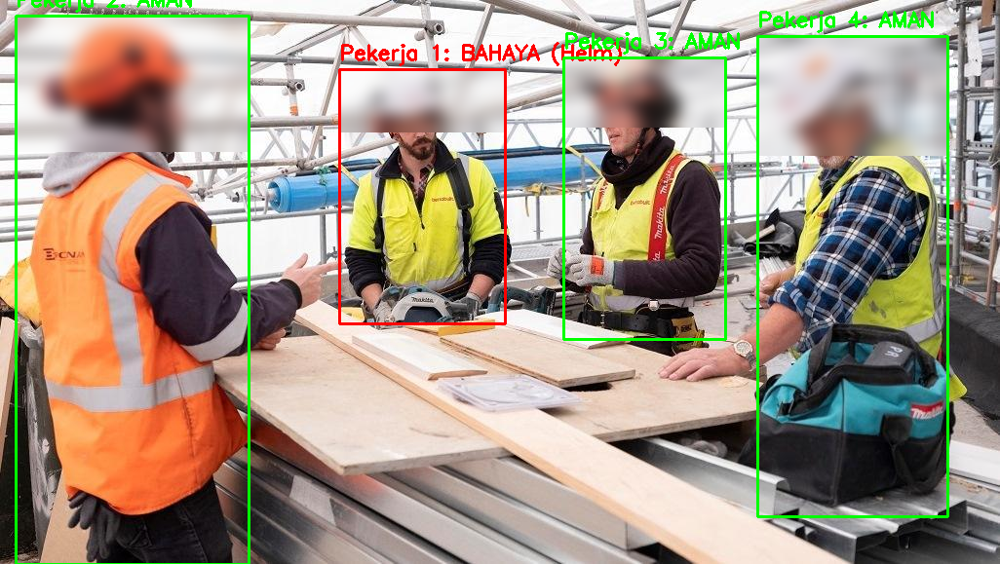


--- 2. Menjalankan Uji Coba (Blur MATI) ---


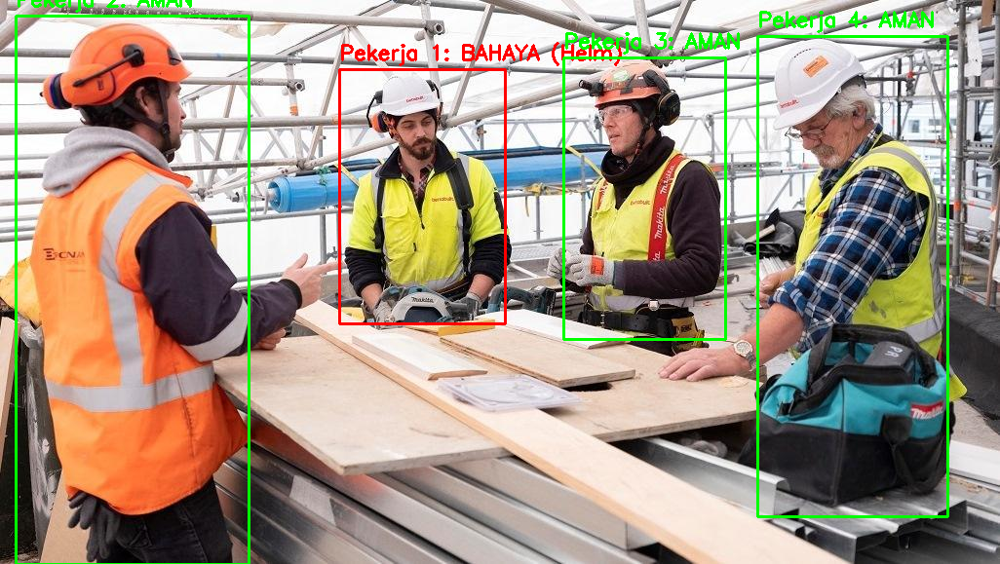

In [4]:
# 1. Baca gambar uji menggunakan OpenCV
img = cv2.imread(test_image_path)

if img is None:
    print(f"Error: Gambar tidak ditemukan di path: {test_image_path}")
    print("Pastikan Anda sudah mengganti nama file di sel 5.1")
else:
    print("Menjalankan prediksi model...")
    # 2. Jalankan prediksi model
    results = model.predict(img, verbose=False) # verbose=False agar log tidak penuh

    print("Menjalankan fungsi audit K3...")
    # 3. Jalankan fungsi audit (Gunakan threshold 0.4 dari analisis kurva)
    laporan, gambar_hasil = run_ppe_audit(results, img, confidence_threshold=0.4)

    # 4. Tampilkan Laporan Kepatuhan (Compliance Report)
    print("\n--- 🕵️‍♂️ LAPORAN KEPATUHAN K3 ---")
    if not laporan:
        print("Tidak ada pekerja yang terdeteksi.")
    else:
        for item in laporan:
            print(f"  ID: {item['id']}")
            print(f"    - Punya Helm? {'✅' if item['has_helmet'] else '❌'}")
            print(f"    - Punya Rompi? {'✅' if item['has_vest'] else '❌'}")
    print("---------------------------------\n")

    # 5. Tampilkan gambar asli dan gambar hasil
    print("Menampilkan Gambar Asli (KIRI) vs. Hasil Audit (KANAN)...")

    # Gabungkan gambar untuk perbandingan
    original_resized = cv2.resize(img, (gambar_hasil.shape[1], gambar_hasil.shape[0]))
    combined_image = np.hstack((original_resized, gambar_hasil))

    # Tampilkan menggunakan cv2_imshow
    cv2_imshow(combined_image)

    # (Kode untuk memuat 'img' tetap sama)
    # ...

    print("--- 1. Menjalankan Uji Coba (Blur AKTIF) ---")
    laporan_blur, img_blur = run_ppe_audit(results, img,
                                          confidence_threshold=0.4,
                                          blur_heads=True)
    cv2_imshow(img_blur)

    print("\n--- 2. Menjalankan Uji Coba (Blur MATI) ---")
    laporan_no_blur, img_no_blur = run_ppe_audit(results, img,
                                                confidence_threshold=0.4,
                                                blur_heads=False)
    cv2_imshow(img_no_blur)